# Add Cell Example

To create new data where we know the ground truth we will insert cells and their masks onto known slides.

In [17]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [22]:
from mediaug.augment import add_cell
from mediaug.dataset import Dataset
from mediaug.image_utils import read_img, get_blank_mask
from mediaug.visulize import show_image, plot_datapoint, plot_img_and_mask

## Load Datasets

Here we load a slide and cell datasets. We then pick a random slide and cell to place on the image.

In [23]:
cells = Dataset('/Users/seanwade/projects/cancerDetection/data/sipakmed_processed/cells')
slides = Dataset('/Users/seanwade/projects/cancerDetection/data/sipakmed_processed/slides')

In [24]:
slide = slides['superficial-intermediate'][1]

In [25]:
cell1 = cells['metaplastic'][1]
cell2 = cells['metaplastic'][2]

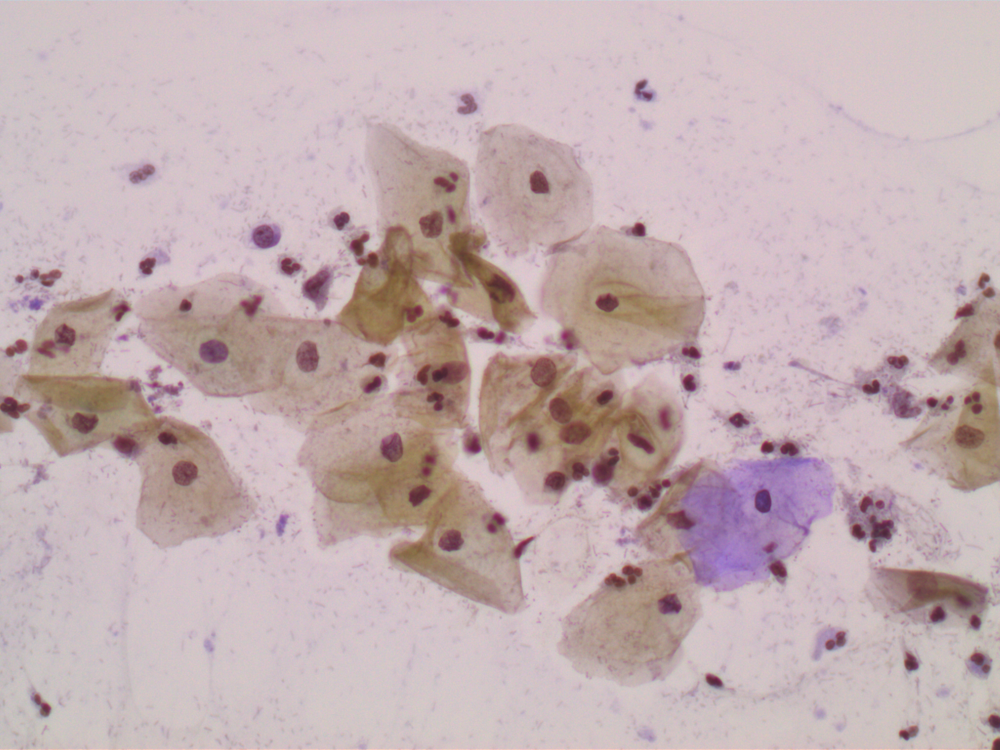

In [26]:
show_image(slide.img)

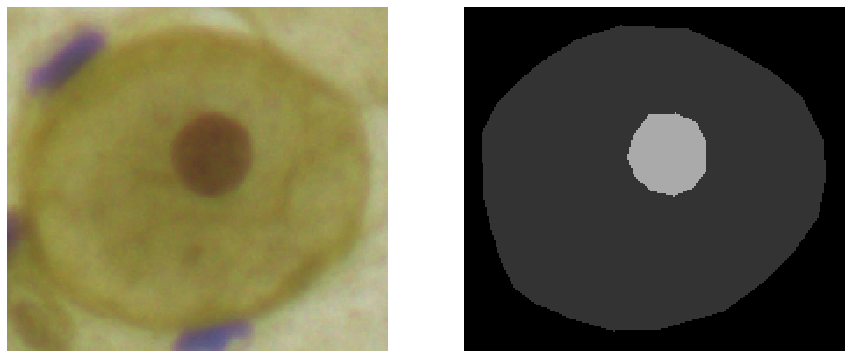

In [7]:
plot_datapoint(cell1)

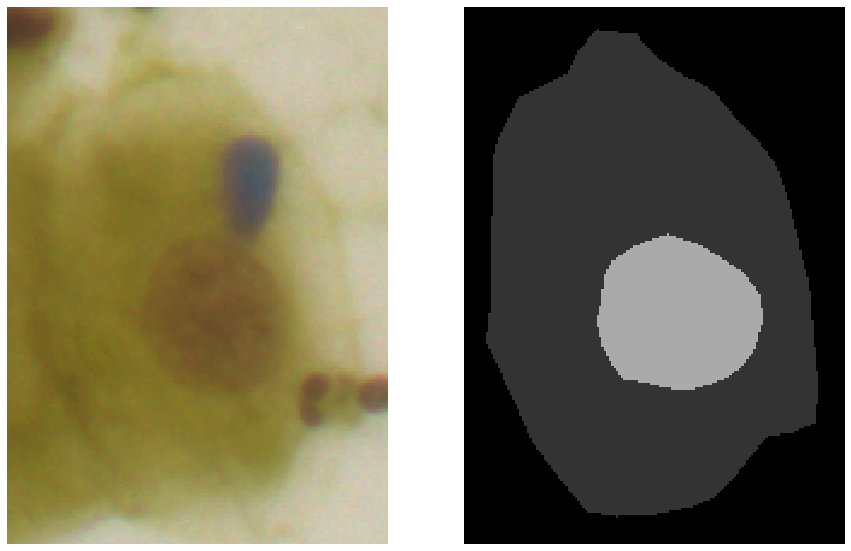

In [8]:
plot_datapoint(cell2)

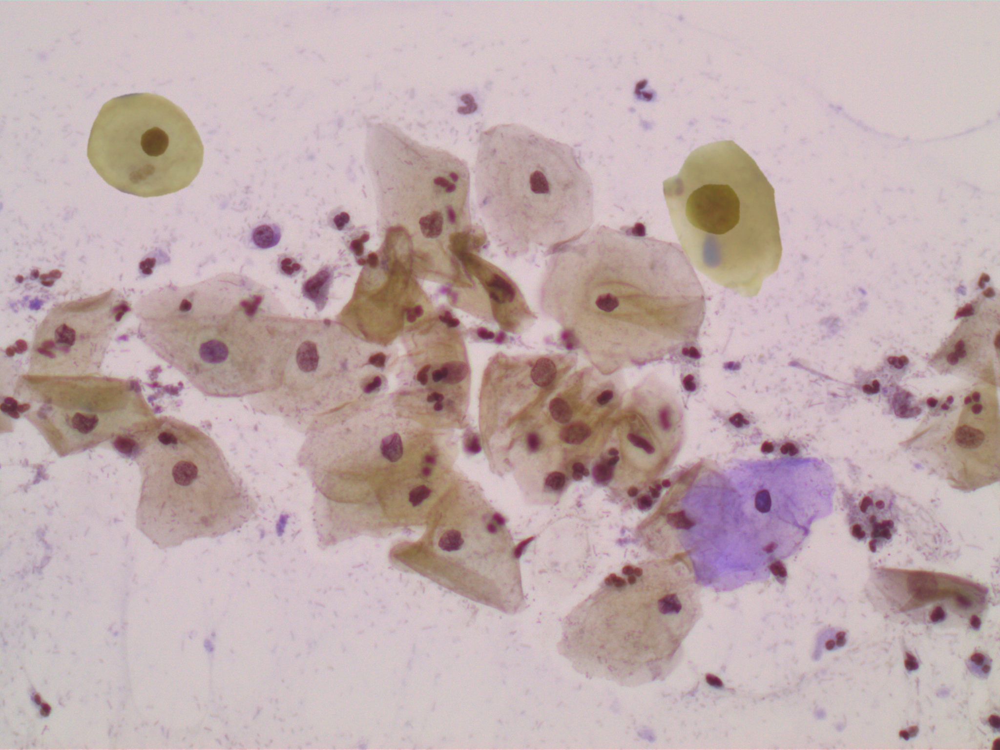

In [9]:
new_img, new_mask = add_cell(slide.img, get_blank_mask(slide.img), cell1.img, cell1.mask, (300,300), 30, 1.2, 2)
new_img, new_mask = add_cell(new_img, new_mask, cell2.img, cell2.mask, (450,1480), 170, 1.6 ,2)

show_image(new_img)

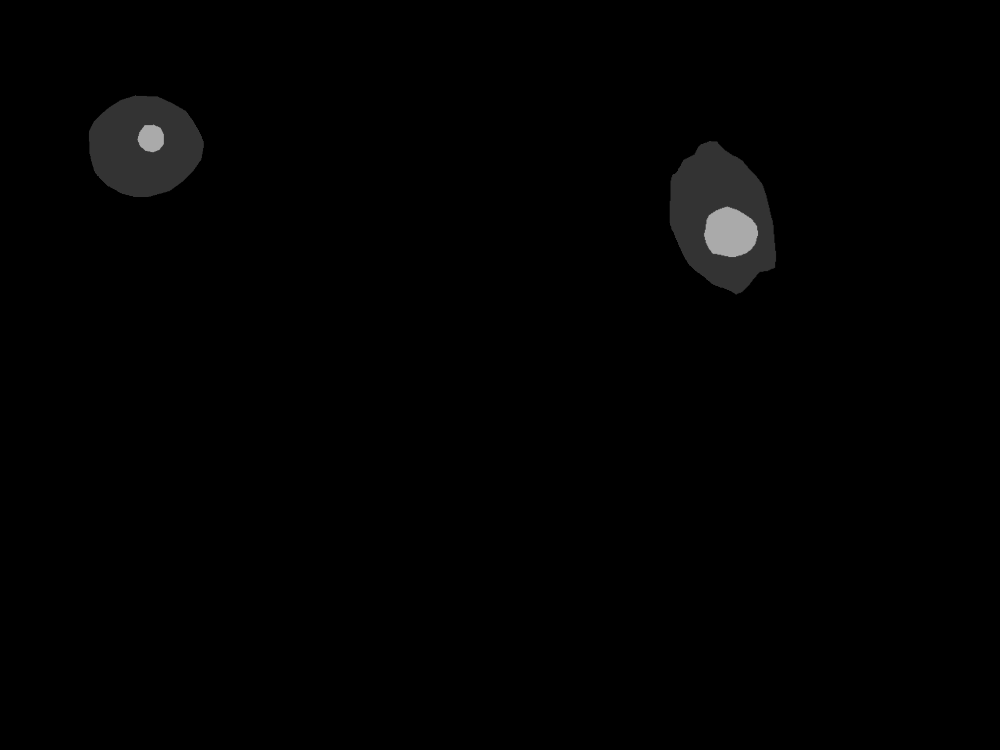

In [10]:
show_image(new_mask)

## Add it to a new Dataset

Now that we have a new synthetic image, we can add it to a dataset.

In [14]:
synth_data = Dataset('/Users/seanwade/Desktop/synth_data', slides.classes)

In [15]:
synth_data.add_data(new_img, new_mask, 'metaplastic', str(1))

In [16]:
synth_data['metaplastic']

[<img_path: /Users/seanwade/Desktop/synth_data/metaplastic/image/1.png>
 <mask_path: /Users/seanwade/Desktop/synth_data/metaplastic/mask/1.png>]